딥러닝과 음악이 만난다면 어떤 Task를 처리할 수 있을까요? 
Speech나 Audio 데이터와는 또 다른 매력을 가지고 있는 음악!
과연 음악데이터는 어떤 특징을 가지고 있고 이를 이용해서 우리는 또 어떤 멋진 문제를 해결할 수 있을까요??

먼저 우리가 Music Data로 부터 어떤 정보를 얻을 수 있는지 알아보고
과연 학계에서는 어떤 Task를 풀고 있는지를 확인해보려고합니다.
마지막으로는 Pytorch를 이용하여 아주 간단한 아키텍쳐를 구현해 보고자합니다!

Python, Pytorch, 그리고 Librosa 함께 우리 음악 데이터를 분석해 봅시다!

### Contents
- (2:00~3:00) Sound Data의 이해와 전처리와 시각화
- (3:00~3:30) Music-Deep Learing 의 주요 Task Review
- (3:30~3:40) Break
- (3:40~5:00) Music Gerne Classification, Music Generation (Optional)

### 이 튜토리얼을 듣고 여러분이 얻어갈 것
- Speech에서도 응용할만한 Sound Data에 대한 기초 이해
- 리뷰 논문을 읽고온 대학원생의 리뷰 논문 리뷰
- 음악 딥러닝 논문 구현에서 쉽게 경험하는 실수
- 실험하기 좋은 아키텍쳐에 대한 대학원생의 고민

### Requirements
- 기본적인 파이썬 프로그래밍
- Python 3.7 (recommended), 3.6 (Good)
- Numpy
- Librosa
- PyTorch 1.0
- 데이터셋을 받을 1GB 이상의 여유공간이 있는 노트북


### Contents 

- 소리란 무엇인가?
- 

## 1. Digital Signal Processing

저희의 목적은 소리 signal를 어떠한 데이터 타입으로 표현하며, 소리와 관련된 task를 해결하는데 있습니다. 그렇다면 소리는 어떠한 데이터를 가지고 있을까요?

### Sound?

소리는 일반적으로 진동으로 인한 공기의 압축으로 생성됩니다. 그렇다면 압축이 얼마나 됬느냐에 따라서 표현되것이 바로 Wave(파동)인데요. 파동은 진동하며 공간/매질을 전파해 나가는 현상입니다. 질량의 이동은 없지만 에너지/운동량의 운반은 존재합니다.

Wave에서 저희가 얻을수 있는 정보는 크게 3가지가 있습니다.
- Phase(Degress of displacement) : 위상
- Frequency : 주파수
- Amplitude(Intensity) : 진폭

<img src='./img/air.png' width=50%>

### Sampling

샘플링은 무엇일까요?? 아날로그 정보를 잘게 쪼개서 discrete한 디지털 정보로 표현해야합니다. 우리는 무한하게 쪼개서 저장할수 없으니, 어떤 기준을 가지고 아날로그 정보를 쪼개서 대표값을 취하게 됩니다.

### 1.1. Time domain

시간을 기준으로 아날로그 시그널을 쪼개게 되는 것을 의미합니다. Sampling을 통하여 컴퓨터는 소리 sequence를 binary value로 받아드리게 됩니다.

__Sampling rate : 얼마나 잘게 쪼갤 것인가?__<br>
잘개 쪼갤수록 원본 데이터와 거이 가까워지기 떄문에 좋지만 Data의 양이 증가하게 됩니다. 만약 너무 크게 쪼개게 된다면, 원본 데이터로 reconstruct하기 힘들어 질 것입니다.

<img src='./img/SampleRate.png' width=70%>

### 1.2. Quantization

시간의 기준이 아닌 실제 amplitude의 real valued 를 기준으로 시그널의 값을 조절합니다. Amplitude를 이산적인 구간으로 나누고, signal 데이터의 Amplitude를 반올림하게 됩니다.

그렇다면 이산적인 구간은 어떻게 나눌수 있을까요?, bit의 비트에 의해서 결정됩니다. 
- B bit의 Quantization : $-2^{B-1}$ ~ $2^{B-1}-1$
- Audio CD의 Quantization (16 bits) : $-2^{15}$ ~ $2^{15}-1$
- 위 값들은 보통 -1.0 ~ 1.0  영역으로 scaling되기도 합니다.

<img src='./img/Quantization.png' width=70%>

### Python tutorial

파일을 업로드 해봅시다.

scipy.io의 librosa.load 함수의 경우, 파일이름을 인자로 받아서 sample rate와 data를 return 해줍니다. 이때의 데이터 타입은 float 32이며 sampling rate의 디폴트 값은 22050입니다.

- 24-bit 데이터인 wav파일은 읽지 못합니다.
- 32-bit floating-point 나 32-bit PCM 이 권장됩니다.
    - PCM(Pulse code modulation) : 아날로그인 소리신호를 디지털로 표현하기 위한 것입니다.

In [1]:
import librosa
import librosa.display

train_audio_path = 'input/pop.wav'
y, sr = librosa.load(str(train_audio_path))

/Users/seungheondoh/anaconda3/envs/python3.6/lib/python3.6/site-packages/matplotlib/__init__.py:1003: UserWarning: Duplicate key in file "/Users/seungheondoh/.matplotlib/matplotlibrc", line #2
  (fname, cnt))


In [2]:
y, sr

(array([-0.0249939 , -0.01815796, -0.02023315, ..., -0.36505127,
        -0.4237976 , -0.42385864], dtype=float32), 22050)

In [3]:
y[0:50]

array([-0.0249939 , -0.01815796, -0.02023315,  0.00231934,  0.01629639,
        0.0272522 ,  0.02905273,  0.02883911,  0.02658081,  0.01513672,
        0.01248169,  0.00457764,  0.00747681, -0.02450562, -0.01156616,
       -0.00671387,  0.03466797,  0.05603027,  0.07266235,  0.0456543 ,
        0.04602051,  0.02441406,  0.02130127,  0.00506592,  0.01760864,
        0.01400757,  0.03741455,  0.0302124 ,  0.01568604, -0.00842285,
       -0.02560425, -0.03390503, -0.03591919, -0.03182983, -0.043396  ,
       -0.04525757, -0.04788208, -0.03591919, -0.019104  ,  0.00186157,
        0.00299072, -0.00845337, -0.01919556, -0.00341797, -0.01327515,
        0.05044556,  0.0088501 ,  0.06988525,  0.04721069,  0.08602905],
      dtype=float32)

In [4]:
len(y)

661504

위 데이터를 jupyter notebook 환경에서 재생시킬수도 있습니다.

In [5]:
import IPython.display as ipd
ipd.Audio(y, rate=sr)

## 2. Sound Representation

위에서 Sampling된 discrete한 데이터를 이제 우리는 표현이 가능합니다. 그렇다면 어떤 요소를 기반으로 저희가 데이터를 표현해야할까요?, 첫번째는 시간의 흐름에 따라, 공기의 파동의 크기로 보는 Time-domain Representation 방법이 있습니다. 두번째는 시간에 따라서 frequency의 변화를 보는 Time-Frequency representation이 있습니다. 

### 2.1. Time domain - Waveform

Waveform의 경우에는 오디오의 자연적이 표현입니다. 시간이 x축으로 그리고 amplitude가 y축으로 표현이 됩니다.

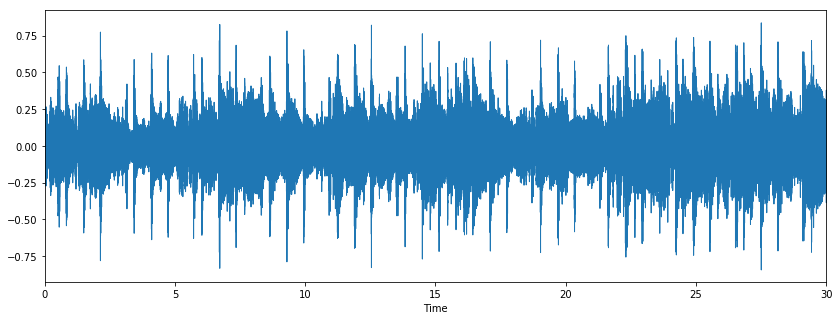

In [6]:
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

fig = plt.figure(figsize = (14,5))
librosa.display.waveplot(y, sr=sr)

### 2.2. Time-Frequency - Spectrogram

시간축과 주파수 축의 변화에 따라서, 진폭 차이를 색상을 통해 보여줍니다.
스펙토로그램은 소리나 파동을 시각화하여 파악하는 도구로, waveform 과 spectrum의 특징이 조합되어 있습니다.

- waveform : 시간축 변화에 따라 진폭의 변화를 시각화합니다.
- spectrum : 주파수 축의 변화에 따라 진폭축의 변화를 볼수 있습니다.
- spectrogram : 시간축과 주파수 축 변화에 따라 진폭차이를 색상을 통해 보여줍니다.

In [7]:
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
D[0:1] ,D.shape

(array([[-57.238033, -68.030106, -58.63585 , ..., -60.651947, -35.656086,
         -29.75666 ]], dtype=float32), (1025, 1293))

Text(0.5, 1.0, 'Linear-frequency power spectrogram')

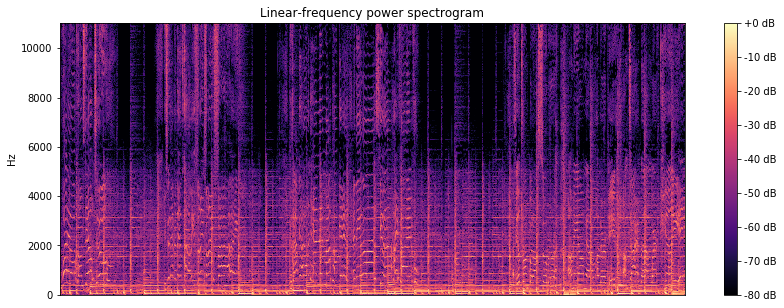

In [8]:
fig = plt.figure(figsize = (14,5))
librosa.display.specshow(D, y_axis='linear')
plt.colorbar(format='%+2.0f dB')
plt.title('Linear-frequency power spectrogram')

### Chroma

주파수 영역을 우리가 알고 있는 Note영역으로 표현이 가능합니다.

In [9]:
chroma_orig = librosa.feature.chroma_cqt(y=y, sr=sr)
chroma_orig, len(chroma_orig)

(array([[0.80113713, 1.        , 0.68713558, ..., 0.27765823, 0.36245306,
         0.57273259],
        [0.59533291, 0.85792007, 0.80931406, ..., 0.65978636, 0.71612424,
         0.74104268],
        [0.522876  , 0.53620142, 1.        , ..., 1.        , 1.        ,
         1.        ],
        ...,
        [0.87285863, 0.65345705, 0.49808783, ..., 0.47396642, 0.44909901,
         0.34435096],
        [0.41731484, 0.52730611, 0.59697892, ..., 0.27611393, 0.41418351,
         0.46914466],
        [1.        , 0.85749739, 0.69573175, ..., 0.11686533, 0.30326576,
         0.2987588 ]]), 12)

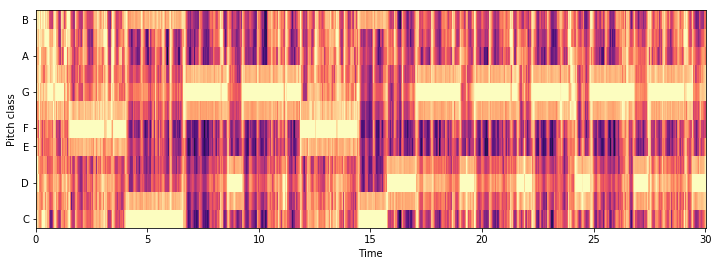

In [10]:
plt.figure(figsize=(12, 4))
librosa.display.specshow(librosa.amplitude_to_db(chroma_orig, ref=np.max),y_axis='chroma', x_axis='time')

In [11]:
y_harm = librosa.effects.harmonic(y=y, margin=8)
chroma_os_harm = librosa.feature.chroma_cqt(y=y_harm, sr=sr, bins_per_octave=12*3)

In [42]:
chroma_os_harm.shape

(12, 1293)

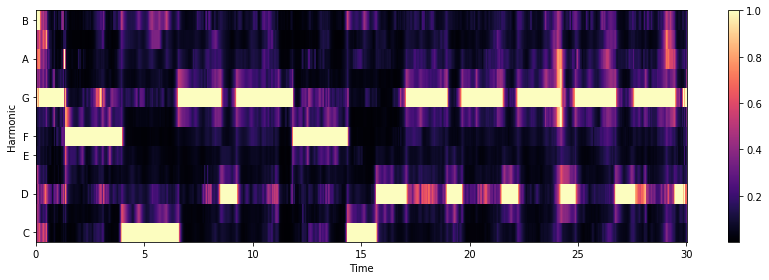

In [12]:
plt.figure(figsize=(12, 4))
librosa.display.specshow(chroma_os_harm, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.ylabel('Harmonic')
plt.tight_layout()

### Onset

Onset detection

In [13]:
onset_frames = librosa.onset.onset_detect(y, sr=sr)
onset_frames

array([   3,    8,   22,   36,   50,   56,   64,   75,   84,   92,  100,
        120,  134,  147,  163,  176,  190,  204,  219,  226,  232,  240,
        246,  260,  275,  281,  288,  301,  306,  316,  322,  330,  352,
        358,  372,  395,  400,  414,  428,  443,  450,  456,  470,  477,
        484,  498,  512,  522,  528,  540,  554,  567,  576,  581,  589,
        596,  610,  616,  624,  630,  638,  652,  666,  674,  680,  694,
        702,  708,  737,  750,  764,  779,  792,  800,  806,  813,  820,
        848,  862,  876,  891,  898,  904,  918,  925,  932,  940,  947,
        957,  976,  988, 1003, 1016, 1037, 1044, 1055, 1066, 1072, 1087,
       1092, 1100, 1113, 1122, 1129, 1135, 1142, 1156, 1168, 1181, 1184,
       1205, 1212, 1229, 1240, 1246, 1254, 1261, 1268, 1283])

In [14]:
onset_times = librosa.frames_to_time(onset_frames, sr=sr)
onset_times

array([ 0.06965986,  0.18575964,  0.510839  ,  0.83591837,  1.16099773,
        1.30031746,  1.4860771 ,  1.7414966 ,  1.95047619,  2.13623583,
        2.32199546,  2.78639456,  3.11147392,  3.41333333,  3.78485261,
        4.08671202,  4.41179138,  4.73687075,  5.08517007,  5.24770975,
        5.38702948,  5.57278912,  5.71210884,  6.03718821,  6.38548753,
        6.52480726,  6.68734694,  6.98920635,  7.10530612,  7.33750567,
        7.4768254 ,  7.66258503,  8.17342404,  8.31274376,  8.63782313,
        9.17188209,  9.28798186,  9.61306122,  9.93814059, 10.28643991,
       10.44897959, 10.58829932, 10.91337868, 11.07591837, 11.23845805,
       11.56353741, 11.88861678, 12.12081633, 12.26013605, 12.53877551,
       12.86385488, 13.16571429, 13.37469388, 13.49079365, 13.67655329,
       13.83909297, 14.16417234, 14.30349206, 14.4892517 , 14.62857143,
       14.81433107, 15.13941043, 15.4644898 , 15.65024943, 15.78956916,
       16.11464853, 16.30040816, 16.43972789, 17.11310658, 17.41

In [15]:
onset_samples = librosa.frames_to_samples(onset_frames)
onset_samples

array([  1536,   4096,  11264,  18432,  25600,  28672,  32768,  38400,
        43008,  47104,  51200,  61440,  68608,  75264,  83456,  90112,
        97280, 104448, 112128, 115712, 118784, 122880, 125952, 133120,
       140800, 143872, 147456, 154112, 156672, 161792, 164864, 168960,
       180224, 183296, 190464, 202240, 204800, 211968, 219136, 226816,
       230400, 233472, 240640, 244224, 247808, 254976, 262144, 267264,
       270336, 276480, 283648, 290304, 294912, 297472, 301568, 305152,
       312320, 315392, 319488, 322560, 326656, 333824, 340992, 345088,
       348160, 355328, 359424, 362496, 377344, 384000, 391168, 398848,
       405504, 409600, 412672, 416256, 419840, 434176, 441344, 448512,
       456192, 459776, 462848, 470016, 473600, 477184, 481280, 484864,
       489984, 499712, 505856, 513536, 520192, 530944, 534528, 540160,
       545792, 548864, 556544, 559104, 563200, 569856, 574464, 578048,
       581120, 584704, 591872, 598016, 604672, 606208, 616960, 620544,
      

In [16]:
clicks = librosa.clicks(times=onset_times, length=len(y))
ipd.Audio(y+clicks, rate=sr)

### Harmony and Percussive

/Users/seungheondoh/anaconda3/envs/python3.6/lib/python3.6/site-packages/librosa/core/spectrum.py:983: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  warnings.warn('amplitude_to_db was called on complex input so phase '


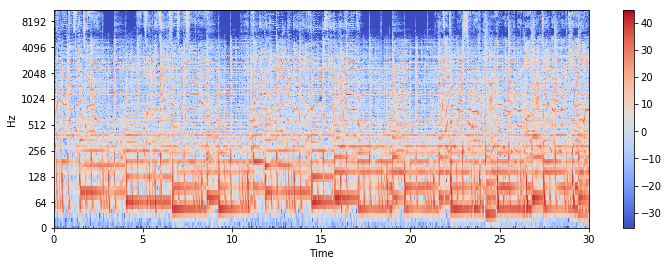

In [17]:
plt.figure(figsize=(12, 4))
X = librosa.stft(y)
Xmag = librosa.amplitude_to_db(X)
librosa.display.specshow(Xmag, sr=sr, x_axis='time', y_axis='log')
plt.colorbar()

In [18]:
H, P = librosa.decompose.hpss(X)
Hmag = librosa.amplitude_to_db(H)
Pmag = librosa.amplitude_to_db(P)

In [19]:
h = librosa.istft(H)
ipd.Audio(h, rate=sr)

In [20]:
p = librosa.istft(P)
ipd.Audio(p, rate=sr)

### Beat and Tempo

In [21]:
tempo, beats = librosa.beat.beat_track(y=y, sr=sr)

In [22]:
tempo

92.28515625

In [23]:
beats

array([   9,   36,   65,   92,  120,  148,  176,  204,  233,  260,  289,
        317,  345,  372,  401,  428,  457,  485,  513,  540,  567,  596,
        625,  652,  681,  708,  737,  764,  793,  820,  849,  876,  905,
        932,  958,  988, 1017, 1044, 1073, 1100, 1129, 1157, 1185, 1213,
       1241])

In [24]:
librosa.frames_to_time(beats, sr=sr)

array([ 0.20897959,  0.83591837,  1.50929705,  2.13623583,  2.78639456,
        3.43655329,  4.08671202,  4.73687075,  5.41024943,  6.03718821,
        6.71056689,  7.36072562,  8.01088435,  8.63782313,  9.31120181,
        9.93814059, 10.61151927, 11.261678  , 11.91183673, 12.53877551,
       13.16571429, 13.83909297, 14.51247166, 15.13941043, 15.81278912,
       16.43972789, 17.11310658, 17.74004535, 18.41342404, 19.04036281,
       19.7137415 , 20.34068027, 21.01405896, 21.64099773, 22.24471655,
       22.94131519, 23.61469388, 24.24163265, 24.91501134, 25.54195011,
       26.2153288 , 26.86548753, 27.51564626, 28.16580499, 28.81596372])

In [25]:
onset_env = librosa.onset.onset_strength(y, sr=sr,aggregate=np.median)
tempo, beats = librosa.beat.beat_track(onset_envelope=onset_env,sr=sr)

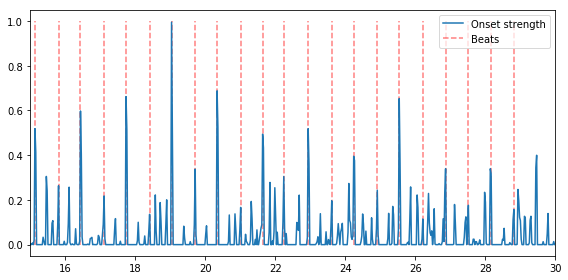

In [26]:
hop_length = 512
plt.figure(figsize=(8, 4))
times = librosa.frames_to_time(np.arange(len(onset_env)),sr=sr, hop_length=hop_length)
plt.plot(times, librosa.util.normalize(onset_env),label='Onset strength')
plt.vlines(times[beats], 0, 1, alpha=0.5, color='r',linestyle='--', label='Beats')
plt.legend(frameon=True, framealpha=0.75)
plt.xlim(15, 30)
plt.gca().xaxis.set_major_formatter(librosa.display.TimeFormatter())
plt.tight_layout()

In [27]:
dtempo = librosa.beat.tempo(onset_envelope=onset_env, sr=sr,aggregate=None)
len(dtempo)

1293

In [28]:
tempo = np.asscalar(tempo)
ac = librosa.autocorrelate(onset_env, 2*sr // hop_length)
freqs = librosa.tempo_frequencies(len(ac), sr=sr, hop_length=hop_length)

In [29]:
len(onset_env),len(ac)

(1293, 86)

In [30]:
tg = librosa.feature.tempogram(onset_envelope=onset_env, sr=sr,hop_length=hop_length)
tg, len(tg)

(array([[ 1.00000000e+00,  1.00000000e+00,  1.00000000e+00, ...,
          1.00000000e+00,  1.00000000e+00,  1.00000000e+00],
        [ 5.38732586e-01,  5.38219217e-01,  5.37708881e-01, ...,
          5.20655122e-01,  5.20681773e-01,  5.20703957e-01],
        [ 1.48331237e-01,  1.47620664e-01,  1.46906728e-01, ...,
          8.11977558e-02,  8.10293945e-02,  8.08610579e-02],
        ...,
        [ 2.67933439e-16,  2.44858662e-16,  2.00934941e-16, ...,
          5.29315833e-18, -1.80873469e-17, -3.57034107e-17],
        [ 3.31687549e-16,  3.07476027e-16,  2.89808654e-16, ...,
          2.41169442e-16,  2.00304868e-16,  1.87562294e-16],
        [ 5.05072520e-16,  4.94141673e-16,  4.43221599e-16, ...,
          5.10003095e-16,  4.54509305e-16,  4.55247944e-16]]), 384)

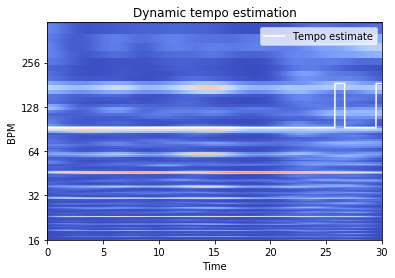

In [31]:
plt.figure()
librosa.display.specshow(tg, x_axis='time', y_axis='tempo')
plt.plot(librosa.frames_to_time(np.arange(len(dtempo))), dtempo,color='w', linewidth=1.5, label='Tempo estimate')
plt.title('Dynamic tempo estimation')
plt.legend(frameon=True, framealpha=0.75)

### NMF Source Seperation

In [32]:
import scipy
figsize=(8, 4)

In [33]:
fs_target = 22050
x = np.arange(len(y))/fs_target
# 80ms frame size를 사용합니다.
frame_size = 80e-3
# 40ms hop length 를 사용하려고한다.
overlap = 0.5
dft_size = frame_size

# fft detail
n_fft = int(frame_size*fs_target)
hop_length = int((1-overlap)*frame_size*fs_target)
window = scipy.signal.hann(n_fft)
print(n_fft, hop_length)

1764 882


(883, 751)
1764 882


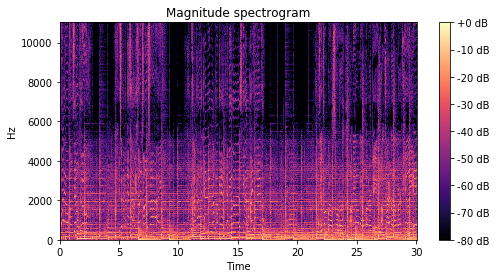

In [34]:
spec = librosa.core.stft(y, n_fft = n_fft, hop_length = hop_length, window = scipy.signal.hann(n_fft), center= True )
print(np.shape(spec))
print(n_fft, hop_length)
D = librosa.amplitude_to_db(np.abs(spec), ref=np.max)
plt.figure(figsize=figsize)
librosa.display.specshow(D, y_axis='linear', x_axis='time', sr = fs_target, hop_length = n_fft/2)
plt.colorbar(format='%+2.0f dB')
plt.title("Magnitude spectrogram")
plt.show()

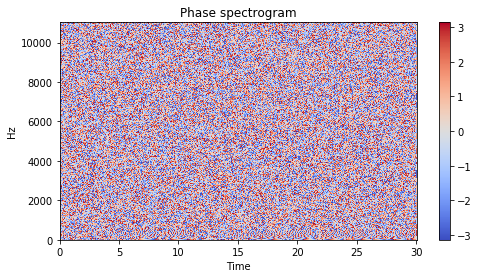

In [35]:
E = np.angle(spec, deg = 0)
plt.figure(figsize=figsize)
librosa.display.specshow(E, y_axis='linear', x_axis='time', sr = fs_target, hop_length = n_fft/2)
plt.title("Phase spectrogram")
plt.colorbar()
plt.show()

In [36]:
from sklearn.decomposition import NMF

model = NMF(n_components=3, init='nndsvd', random_state=0,solver="mu",beta_loss="frobenius",max_iter = 1000)
W = model.fit_transform(np.abs(spec))
H = model.components_
print(model.reconstruction_err_)

/Users/seungheondoh/anaconda3/envs/python3.6/lib/python3.6/site-packages/sklearn/decomposition/nmf.py:212: UserWarning: The multiplicative update ('mu') solver cannot update zeros present in the initialization, and so leads to poorer results when used jointly with init='nndsvd'. You may try init='nndsvda' or init='nndsvdar' instead.
  UserWarning)


1617.4189484492947


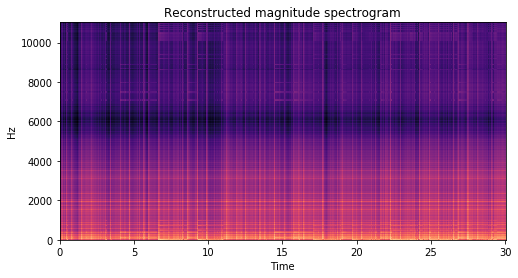

In [37]:
D = librosa.amplitude_to_db((np.matmul(W,H)), ref=np.max)
plt.figure(figsize=figsize)
librosa.display.specshow(D, y_axis='linear', x_axis='time',sr = fs_target, hop_length = n_fft/2)
plt.title("Reconstructed magnitude spectrogram")
plt.show()

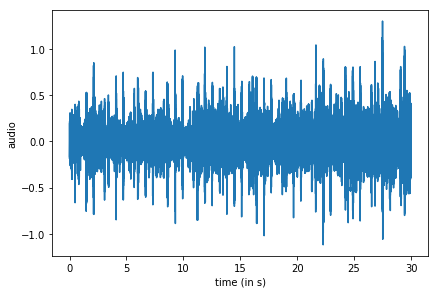

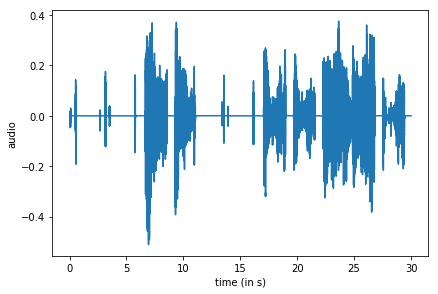

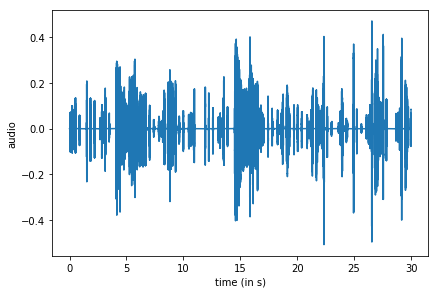

In [38]:
from scipy.io.wavfile import write

phase = np.angle(spec)
total = 0
audios = []
for i in range(0,np.shape(W)[1]):
    component= np.outer(W[:,i],(H[i,:]))
    component = component*phase
    audio2 = librosa.core.istft(component, hop_length=n_fft//2)
    audios.append(audio2)
    plt.figure()
    plt.plot(x[:661500],audio2)
    plt.tight_layout()
    plt.xlabel("time (in s)")
    plt.ylabel("audio")
    plt.show()
    total = total + audio2 
#     write("component" +str(i) + ".wav", 22050, audio2)
    ipd.display(ipd.Audio(audio2, rate=sr))
    audio2_rescaled = audio2/ np.max(audio2)
#     write("component" +str(i) + "_rescaled.wav", 22050, audio2_rescaled)
#     ipd.display(ipd.Audio(audio2_rescaled, rate=sr))

In [39]:
total

array([0.20773354, 0.20142695, 0.15384851, ..., 0.32133666, 0.26401845,
       0.38001743], dtype=float32)

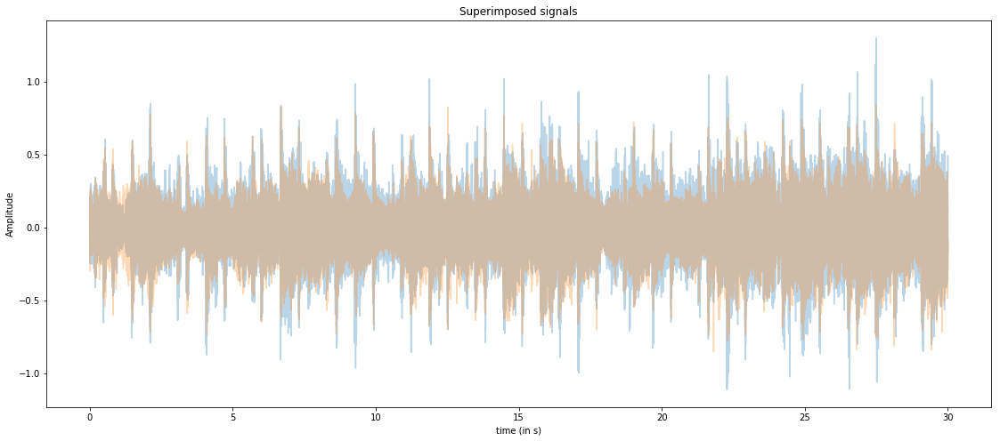

In [40]:

# plotting sum of components and the original signal
plt.figure(figsize = (19,8))
plt.title("Superimposed signals")
plt.xlabel("time (in s)")
plt.ylabel("Amplitude")
plt.plot(x[:661500],total,alpha = 0.3)
plt.plot(x,y,alpha = 0.3)
plt.show()

error = np.array(total) - np.array(y[:661500])

### Tag

- Millionsong data - mood tag가 확실한 친구
- 단어별 mood space
- VQA

-------------------
GrooAVE velocity

멜로디에 드럼 라인이 잘들어갔다 Lofi-hip
멜로디에 드럼이다. 
- Rythm analysis
- Score level
    - Sample 에 대해서 무엇을뽑는가?
- Sentiment analysis
    - Acoustic
    - Mood analysis
    
드럼의 latent space, 그리고 사람의 mood tag를 사용 해본다.
Sample을 선택하고 Drum을 찍는다. vst는 시퀀스에 샘플을 바꾸면서 소리의 변화를 본다.

Drum의 meta data

### 멀티트렉 레이어를 사용한다.

### Image Segmentation 알고리즘을 찾아보자.

### 시맨틱 레이블링.
tempo 역시 sementic한 레이블이있다. tempo로 레이블을 넣는다.

- 음악에서 관련된 정보를 만들어준다.
- Sample과 mating score를 넣어준다.
- Percurssive data
    - drum tag가 있다
    - multi-track recoding db

MIR커뮤니티의 논문, audio visual, audio book

Loss weight and Events based Loss

- OuterHair-SE 
- GRU
- FML Small
- 